# Transformers Based Research Paper Summarization

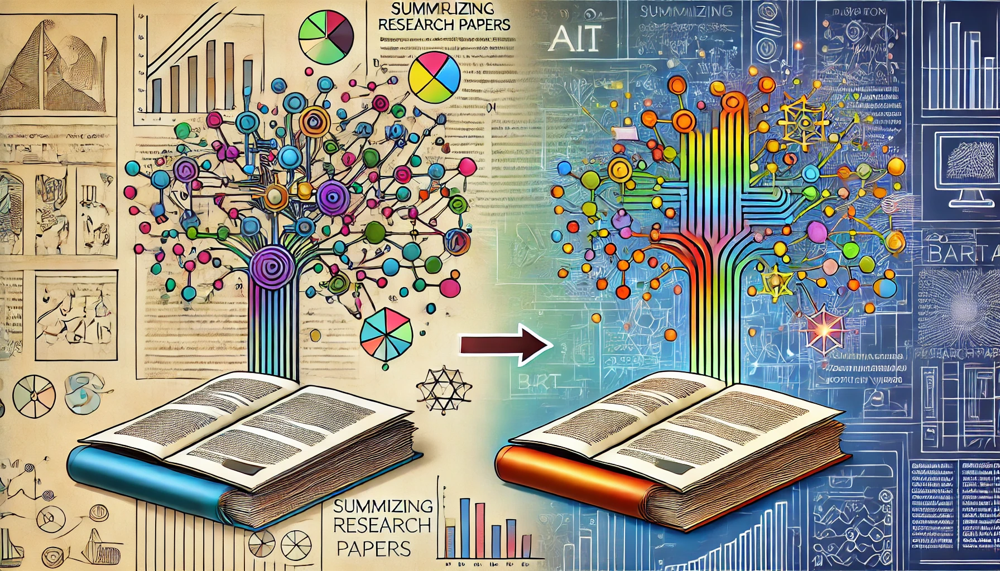
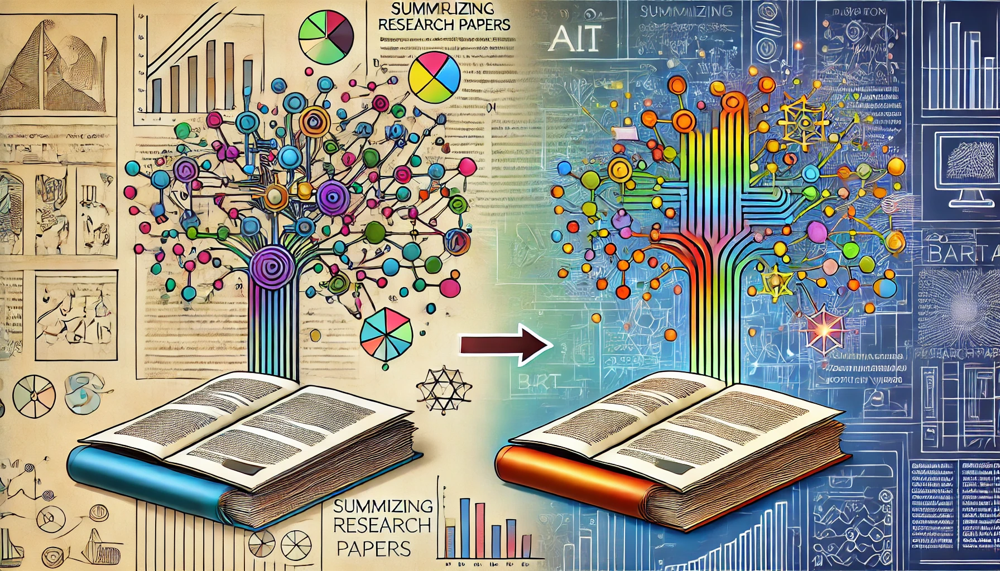

In [6]:
!pip install arxiv
!pip install transformers

In [7]:
import arxiv
import pandas as pd
from transformers import pipeline

In [41]:
# Search any kind of subjects
query = 'biotechnology'
search = arxiv.Search(query=query, max_results=10, sort_by=arxiv.SortCriterion.SubmittedDate)
# Fetch papers
papers = []
for result in search.results():
    papers.append({
        'published': result.published,
        'title': result.title,
        'abstract': result.summary,
        'categories': result.categories

    })

# Convert to DataFrame
df = pd.DataFrame(papers)
pd.set_option('display.max_colwidth', None)
df.head()

/tmp/ipykernel_30/3134067621.py:6: DeprecationWarning: The 'Search.results' method is deprecated, use 'Client.results' instead
  for result in search.results():


,published,title,abstract,categories
0,2024-11-06 12:35:47+00:00,Safe Paths and Sequences for Scalable ILPs in RNA Transcript Assembly Problems,"A common step at the core of many RNA transcript assembly tools is to find a\nset of weighted paths that best explain the weights of a DAG. While such\nproblems easily become NP-hard, scalable solvers exist only for a basic\nerror-free version of this problem, namely minimally decomposing a network flow\ninto weighted paths.\n The main result of this paper is to show that we can achieve speedups of two\norders of magnitude also for path-finding problems in the realistic setting\n(i.e., the weights do not induce a flow). We obtain these by employing the\nsafety information that is encoded in the graph structure inside Integer Linear\nProgramming (ILP) solvers for these problems. We first characterize the paths\nthat appear in all path covers of the DAG, generalizing a graph reduction\ncommonly used in the error-free setting (e.g. by Kloster et al. [ALENEX~2018]).\nSecondly, following the work of Ma, Zheng and Kingsford [RECOMB 2021], we\ncharacterize the \emph{sequences} of arcs that appear in all path covers of the\nDAG.\n We experiment with a path-finding ILP model (least squares) and with a more\nrecent and accurate one. We use a variety of datasets originally created by\nShao and Kingsford [TCBB, 2017], as well as graphs built from sequencing reads\nby the state-of-the-art tool for long-read transcript discovery, IsoQuant\n[Prjibelski et al., Nat.~Biotechnology~2023]. The ILPs armed with safe paths or\nsequences exhibit significant speed-ups over the original ones. On graphs with\na large width, average speed-ups are in the range $50-160\times$ in the latter\nILP model and in the range $100-1000\times$ in the least squares model.\n Our scaling techniques apply to any ILP whose solution paths are a path cover\nof the arcs of the DAG. As such, they can become a scalable building block of\npractical RNA transcript assembly tools, avoiding heuristic trade-offs\ncurrently needed on complex graphs.",[cs.DS]
1,2024-11-01 13:03:51+00:00,Tracking one-in-a-million: Large-scale benchmark for microbial single-cell tracking with experiment-aware robustness metrics,"Tracking the development of living cells in live-cell time-lapses reveals\ncrucial insights into single-cell behavior and presents tremendous potential\nfor biomedical and biotechnological applications. In microbial live-cell\nimaging (MLCI), a few to thousands of cells have to be detected and tracked\nwithin dozens of growing cell colonies. The challenge of tracking cells is\nheavily influenced by the experiment parameters, namely the imaging interval\nand maximal cell number. For now, tracking benchmarks are not widely available\nin MLCI and the effect of these parameters on the tracking performance are not\nyet known. Therefore, we present the largest publicly available and annotated\ndataset for MLCI, containing more than 1.4 million cell instances, 29k cell\ntracks, and 14k cell divisions. With this dataset at hand, we generalize\nexisting tracking metrics to incorporate relevant imaging and experiment\nparameters into experiment-aware metrics. These metrics reveal that current\ncell tracking methods crucially depend on the choice of the experiment\nparameters, where their performance deteriorates at high imaging intervals and\nlarge cell colonies. Thus, our new benchmark quantifies the influence of\nexperiment parameters on the tracking quality, and gives the opportunity to\ndevelop new data-driven methods that generalize across imaging and experiment\nparameters. The benchmark dataset is publicly available at\nhttps://zenodo.org/doi/10.5281/zenodo.7260136.",[cs.CV]
2,2024-10-21 14:45:20+00:00,Characterizing RNA oligomers using Stochastic Titration Constant-pH Metadynamics simulations,"RNA molecules exhibit various biological functions intrinsically dependent on\ntheir diverse ecosystem of highly flexible structures. This flexi

In [42]:
# Example abstract from API
abstract = df['abstract'][9]
summarizer = pipeline("summarization", model="facebook/bart-large-cnn")
# Summarization
summarization_result = summarizer(abstract)

/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [39]:
summarization_result[0]['summary_text']

'Artificial Intelligence (AI) can provide tools to deal with these scenarios. The Global South AI for Pandemic & Epidemic Preparedness & Response Network (AI4PEP) has developed 16 projects across 16 countries in the Global South. LAC has high potential to help fight infectious disease, particularly in low- and middle-income countries.'

#### You can change the topic and summarize it yourself, enjoy it.